In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pygimli as pg
import pygimli.meshtools as mt
from pygimli.physics import ert

## Complex-valued resistivity modelling

In [2]:
# Create a protocol for synthetic modelling
scheme = ert.createData(elecs=np.arange(50.1), schemeName='dd')
print(scheme)

Data: Sensors: 51 data: 1176, nonzero entries: ['a', 'b', 'm', 'n', 'valid']


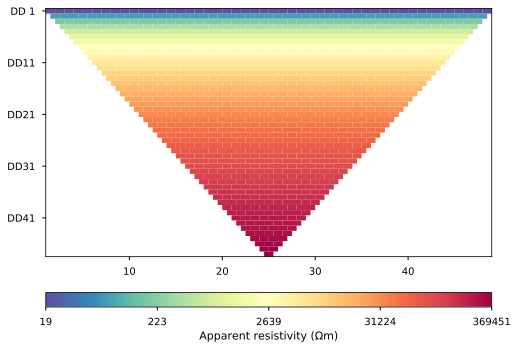

In [3]:
scheme["k"] = ert.geometricFactors(scheme)
pg.show(scheme, -scheme["k"], logScale=True);

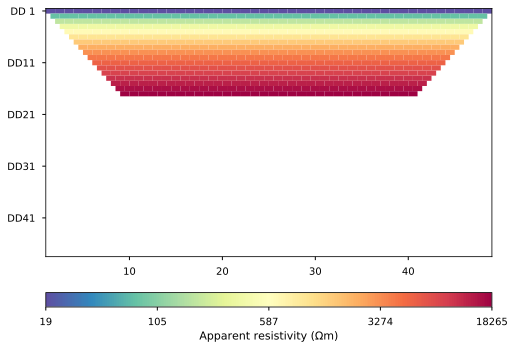

In [4]:
scheme.markInvalid(np.abs(scheme["k"]) > 20000)
pg.show(scheme, -scheme["k"]);

Data: Sensors: 51 data: 680, nonzero entries: ['a', 'b', 'k', 'm', 'n', 'valid']


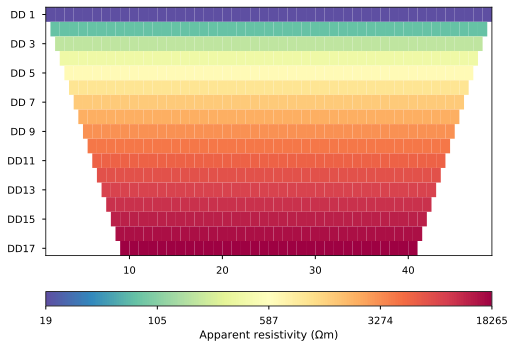

In [5]:
scheme.removeInvalid()
print(scheme)
pg.show(scheme, -scheme["k"]);

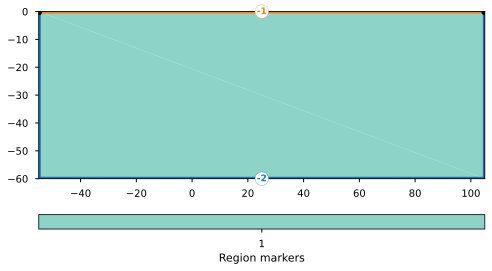

In [6]:
world = mt.createWorld(start=[-55, 0], end=[105, -60], worldMarker=True)
pg.show(world, markers=True);

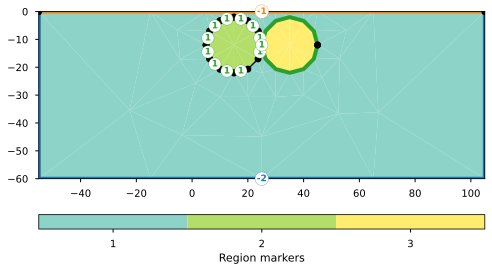

In [7]:
circle1 = mt.createCircle(pos=[15, -12], radius=10, marker=2)
circle2 = mt.createCircle(pos=[35, -12], radius=10, marker=3)
plc = world + circle1 + circle2
pg.show(plc, markers=True);

Mesh: Nodes: 940 Cells: 1634 Boundaries: 2573
Mesh: Nodes: 3513 Cells: 1634 Boundaries: 2573


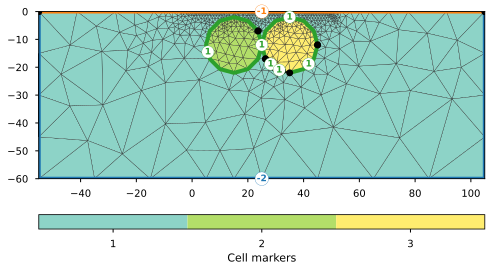

In [8]:
for s in scheme.sensors():
    plc.createNode(s)
    plc.createNode(s + [0.0, -0.2])

mesh1 = mt.createMesh(plc, quality=34)
print(mesh1)
pg.show(mesh1, markers=True, showMesh=True)
# additional refinements
mesh = mesh1.createP2()
print(mesh)

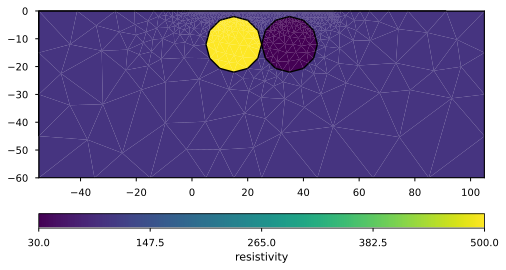

In [9]:
# Let's do some pure ERT modelling
rhomap = [[1, 100], [2, 500], [3, 30]]
pg.show(mesh, rhomap, label="resistivity");

Data error estimate (min:max)  0.030018674146663815 : 0.07478767179858756


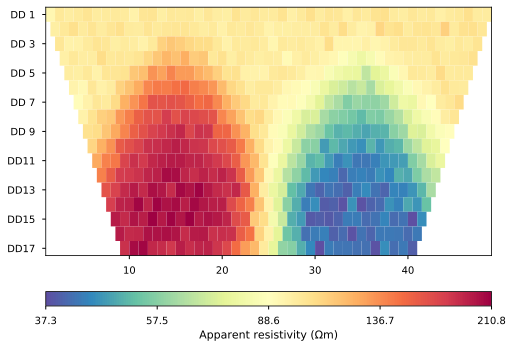

In [10]:
data = ert.simulate(mesh, scheme, res=rhomap, noiseLevel=0.03)
pg.show(data);

In [11]:
mgr = ert.ERTManager(data, verbose=True)
mgr.invert(quality=34.4)

26/04/22 - 15:17:03 - pyGIMLi - INFO - Found 2 regions.
26/04/22 - 15:17:03 - pyGIMLi - INFO - Region with smallest marker (1) set to background
26/04/22 - 15:17:03 - pyGIMLi - INFO - Creating forward mesh from region infos.
26/04/22 - 15:17:03 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
26/04/22 - 15:17:04 - pyGIMLi - INFO - Use median(data values)=99.24652739447171
26/04/22 - 15:17:04 - pyGIMLi - INFO - Created startmodel from forward operator: 1116 [99.24652739447171,...,99.24652739447171]
26/04/22 - 15:17:04 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002C1ECF85310>
Data transformation: <pgcore._pygimli_.RTransLogLU object at 0x000002C1F1075D60>
Model transformation: <pgcore._pygimli_.RTransLog object at 0x000002C1ECF85900>
min/max (data): 37.27/211
min/max (error): 3%/7.48%
min/max (start model): 99.25/99.25
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
inv.iter 2 ... chi² = 0.78 (dPhi = 77.1%) lam: 20.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.78)                   #
################################################################################


1116 [98.1455117168373,...,42.09894303774341]

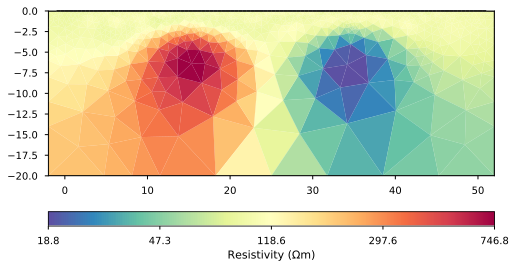

In [12]:
mgr.showResult();

In [13]:
rhomapC = [[1, 100+0j], [2, 500+0j], [3, 100+1j]]
data = ert.simulate(mesh, scheme, res=rhomapC)

26/04/22 - 15:17:08 - pyGIMLi - INFO - Complex resistivity values found.


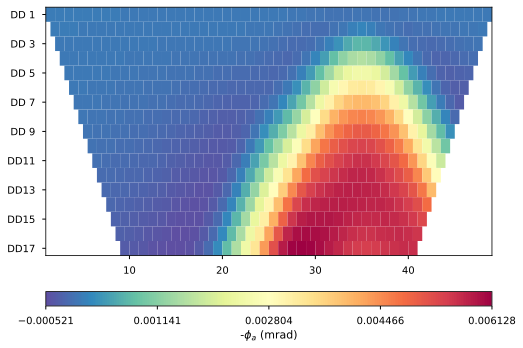

In [14]:
pg.show(data, "phia", label=r"-$\phi_a$ (mrad)");

### FDIP data with pyBERT

In [15]:
import pybert as pb

In [16]:
freq = [0.1, 0.2, 0.5, 1.0, 2.0, 5.0, 10.0, 20.0, 50.0, 
        100.0, 200.0, 500, 1000]
fdip = pb.FDIPdata(f=freq, data=scheme)
rho = np.array([0, 100, 100, 100])  # resistivity in Ohmm
m = np.array([0, 0, 0.4, 0.3])  # chargeability in V/V
tau = np.array([0, 0.001, 0.01, 1.0])  # time constants in s
c = np.array([0, 0, 0.5, 0.5])  # relaxation exponent
fdip.simulate(mesh, rho, m, tau, c);

26/04/22 - 15:17:13 - pyGIMLi - INFO - Complex resistivity values found.
26/04/22 - 15:17:16 - pyGIMLi - INFO - Complex resistivity values found.
26/04/22 - 15:17:19 - pyGIMLi - INFO - Complex resistivity values found.
26/04/22 - 15:17:22 - pyGIMLi - INFO - Complex resistivity values found.
26/04/22 - 15:17:25 - pyGIMLi - INFO - Complex resistivity values found.
26/04/22 - 15:17:28 - pyGIMLi - INFO - Complex resistivity values found.
26/04/22 - 15:17:30 - pyGIMLi - INFO - Complex resistivity values found.
26/04/22 - 15:17:33 - pyGIMLi - INFO - Complex resistivity values found.
26/04/22 - 15:17:36 - pyGIMLi - INFO - Complex resistivity values found.
26/04/22 - 15:17:39 - pyGIMLi - INFO - Complex resistivity values found.
26/04/22 - 15:17:42 - pyGIMLi - INFO - Complex resistivity values found.
26/04/22 - 15:17:46 - pyGIMLi - INFO - Complex resistivity values found.
26/04/22 - 15:17:49 - pyGIMLi - INFO - Complex resistivity values found.


nr= [ 32  80 127 173 218 262 305 347 388 428 467 505 542 578 613 647]


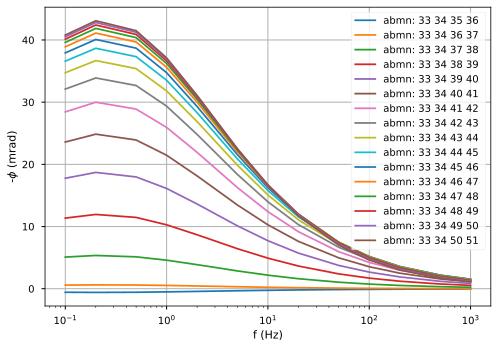

In [17]:
fdip.showDataSpectra(ab=[33, 34]);

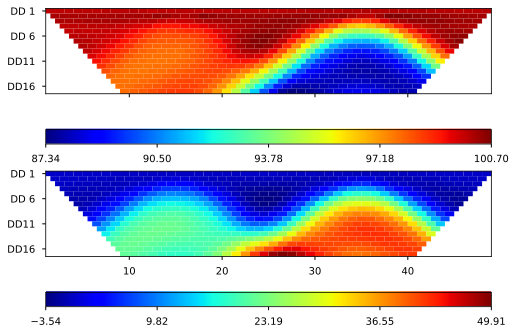

In [18]:
fdip.showSingleFrequencyData(2);

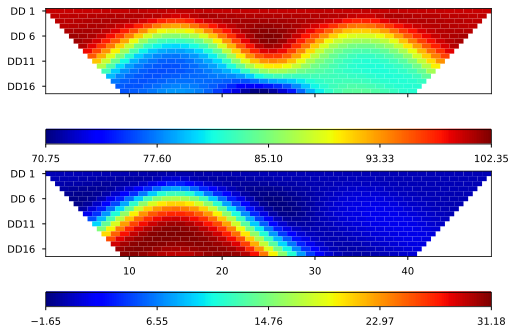

In [19]:
fdip.showSingleFrequencyData(12);

In [20]:
fdip.singleInversion()

26/04/22 - 15:17:55 - pyGIMLi - INFO - Found 2 regions.
26/04/22 - 15:17:55 - pyGIMLi - INFO - Region with smallest marker (1) set to background
26/04/22 - 15:17:55 - pyGIMLi - INFO - Creating forward mesh from region infos.
26/04/22 - 15:17:55 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
26/04/22 - 15:17:55 - pyGIMLi - INFO - Use median(data values)=99.23257249621355
26/04/22 - 15:17:55 - pyGIMLi - INFO - Created startmodel from forward operator: 831 [99.23257249621355,...,99.23257249621355]




WARNING! found negative phases .. taking abs of ip data.


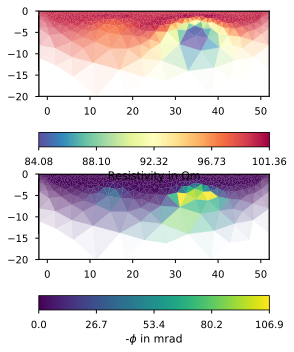

In [21]:
fdip.showSingleResult()

In [22]:
fdip.simultaneousInversion()

2D PD: Mesh: Nodes: 480 Cells: 831 Boundaries: 1310
3D PD: Mesh: Nodes: 6720 Cells: 10803 Boundaries: 3313
8840 10803 10803
8840 10803
WARNING! found negative phases .. switch to abs of ip data.
WARNING! found negative phases .. switch to abs of ip data.
WARNING! found negative phases .. switch to abs of ip data.
WARNING! found negative phases .. switch to abs of ip data.
WARNING! found negative phases .. switch to abs of ip data.
WARNING! found negative phases .. switch to abs of ip data.
WARNING! found negative phases .. switch to abs of ip data.
WARNING! found negative phases .. switch to abs of ip data.
WARNING! found negative phases .. switch to abs of ip data.
WARNING! found negative phases .. switch to abs of ip data.
WARNING! found negative phases .. switch to abs of ip data.
WARNING! found negative phases .. switch to abs of ip data.
WARNING! found negative phases .. switch to abs of ip data.
3.0779365262772093e-06 6.424678880040849


In [26]:
fdip.showAllResults(rmin=50, rmax=200, imax=100);

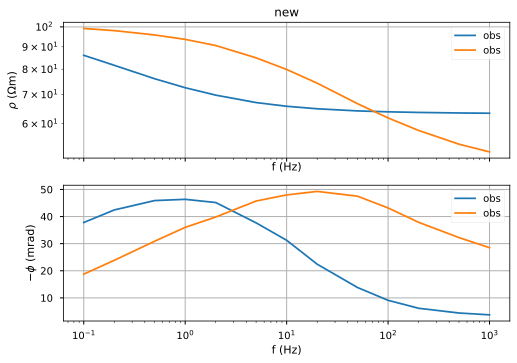

In [31]:
fig, ax = fdip.showModelSpectrum([35, -7]);
fdip.showModelSpectrum([15, -7], ax=ax);